#1: Libraries

In [10]:
import pandas as pd
import numpy as np
from google.colab import drive

import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px

import geopandas as gpd
import folium
from folium.plugins import FastMarkerCluster

from sklearn.preprocessing import OneHotEncoder, LabelEncoder
import sklearn.cluster as cluster
import sklearn.metrics as metrics

from yellowbrick.cluster import KElbowVisualizer
from sklearn.metrics import silhouette_score, silhouette_samples

import matplotlib.cm as cm

#From Lectures
#*
#Saving model for Prediction
import pickle
from scipy.cluster.hierarchy import linkage, fcluster, dendrogram
from sklearn.cluster import KMeans,AgglomerativeClustering,DBSCAN
from scipy.cluster import hierarchy
from sklearn.preprocessing import StandardScaler
#*
import plotly.graph_objects as go

#2: Clustering

##2:1 laden der aufbereitet Data

######2:1:1 Loading

Hier geht es um Daten lesen, in meinen Fall, lese ich aus mein GDrive

In [11]:
drive.mount("/content/drive", force_remount=True)

Mounted at /content/drive


Daten lesen mittels Pandas


In [12]:
df_cat = pd.read_csv("/content/drive/My Drive/prepared_Crime_Data_from_2020_to_Present_20250315.csv")
df_cat

,TIME OCC,AREA,AREA NAME,Rpt Dist No,Severety of crime,Crm Cd,Crm Cd Desc,Mocodes,Vict Age,Vict Sex,...,LON,Weapon Used,Unnamed: 1,Desc,Weapon Cat,Number,Crime,Crime_cat,cat Vict Age,Time Cat
0,2200,1,Central,111,2,626,INTIMATE PARTNER - SIMPLE ASSAULT,2000 0416 0913,30,F,...,-118.2424,400,STRONG-,", FIST, FEET OR BODILY FORCE)""","Strong-Fist, Feet or Bodily Force",626,Spousal/Cohab Abuse - Simple Assault,Simple Assaults,Age 30-39,Night
1,2245,12,77th Street,1268,1,210,ROBBERY,0344 0305 0355,21,M,...,-118.2695,511,VERBAL T,NaN,Verbal,210,Robbery,Robbery,Age 20-29,Night
2,2330,12,77th Street,1268,1,230,"ASSAULT WITH DEADLY WEAPON, AGGRAVATED ASSAULT",1822 0411,28,F,...,-118.2739,201,KNIFE WI,VER 6 INCHES IN LENGTH,Sting weapon,230,ADW,Aggrevated Assaults,Age 20-29,Night
3,940,1,Central,118,2,624,BATTERY - SIMPLE ASSAULT,0913 0400,42,M,...,-118.2295,400,STRONG-,", FIST, FEET OR BODILY FORCE)""","Strong-Fist, Feet or Bodily Force",624,Battery - misdemeanor,Simple Assaults,Age 40-49,Day
4,310,2,Rampart,218,1,310,BURGLARY,1822 1609 0329 0344 0352,36,M,...,-118.2552,500,UNKNOWN,ER WEAPON,Unknown,310,Burglary,Burglary,Age 30-39,Night
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
301513,1600,17,Devonshire,1745,2,624,BATTERY - SIMPLE ASSAULT,0416 1259 2024 0419 0429 0913 1817 1251,16,F,...,-118.5234,400,STRONG-,", FIST, FEET OR BODILY FORCE)""","Strong-Fist, Feet or Bodily Force",624,Battery - misdemeanor,Simple Assaults,Age 10-19,Day
301514,1530,19,Mission,1916,1,230,"ASSAULT WITH DEADLY WEAPON, AGGRAVATED ASSAULT",1259 0416 0417 0913 1817 2024,16,F,...,-118.4414,400,STRONG-,", FIST, FEET OR BODILY FORCE)""","Strong-Fist, Feet or Bodily Force",230,ADW,Aggrevated Assaults,Age 10-19,Day
301515,1210,17,Devonshire,1771,2,624,BATTERY - SIMPLE ASSAULT,1601 0448 1402,67,F,...,-118.5913,400,STRONG-,", FIST, FEET OR BODILY FORCE)""","Strong-Fist, Feet or Bodily Force",624,Battery - misdemeanor,Simple Assaults,Age 60-69,Day
301516,1600,17,Devonshire,1774,2,624,BATTERY - SIMPLE ASSAULT,0400 1259 1822 0356,17,M,...,-118.5233,400,STRONG-,", FIST, FEET OR BODILY FORCE)""","Strong-Fist, Feet or Bodily Force",624,Battery - misdemeanor,Simple Assaults,Age 10-19,Day


In [13]:
df_cat.rename(columns={'Weapon\xa0Cat':'Weapon Cat','Weapon Used ':'Weapon Used'}, inplace= True)

Es kommt aus der Merge von 2 Data Frames in Aufbereitung prozess vom team, hier ist nur formatiert.

In [14]:
df_cat = df_cat.drop(['Unnamed: 1','Number','Desc'], axis=1)

Hier können wir die Kategorisierung fürs Alter (Age Cat) durchführen sonst haben wir mehr als 10 Gruppen und unubersichtlich.

In [15]:
# Child       : 0-12
# Teen        : 13-18
# Young Adult : 19-35
# Adult       : 36-50
# Middle-aged : 51-65
# Senior      : 66-140

bins = [0, 12, 18, 35, 50, 65, 140]
labels = ['Child', 'Teen', 'Young Adult', 'Adult', 'Middle-aged', 'Senior']
df_cat['Age Cat'] = pd.cut(df_cat['Vict Age'], bins=bins, labels=labels, right=False)
df_cat

,TIME OCC,AREA,AREA NAME,Rpt Dist No,Severety of crime,Crm Cd,Crm Cd Desc,Mocodes,Vict Age,Vict Sex,...,LOCATION,LAT,LON,Weapon Used,Weapon Cat,Crime,Crime_cat,cat Vict Age,Time Cat,Age Cat
0,2200,1,Central,111,2,626,INTIMATE PARTNER - SIMPLE ASSAULT,2000 0416 0913,30,F,...,700 N HILL PL,34.0618,-118.2424,400,"Strong-Fist, Feet or Bodily Force",Spousal/Cohab Abuse - Simple Assault,Simple Assaults,Age 30-39,Night,Young Adult
1,2245,12,77th Street,1268,1,210,ROBBERY,0344 0305 0355,21,M,...,SAN PEDRO,33.9610,-118.2695,511,Verbal,Robbery,Robbery,Age 20-29,Night,Young Adult
2,2330,12,77th Street,1268,1,230,"ASSAULT WITH DEADLY WEAPON, AGGRAVATED ASSAULT",1822 0411,28,F,...,100 E 82ND ST,33.9654,-118.2739,201,Sting weapon,ADW,Aggrevated Assaults,Age 20-29,Night,Young Adult
3,940,1,Central,118,2,624,BATTERY - SIMPLE ASSAULT,0913 0400,42,M,...,200 E BLOOM ST,34.0639,-118.2295,400,"Strong-Fist, Feet or Bodily Force",Battery - misdemeanor,Simple Assaults,Age 40-49,Day,Adult
4,310,2,Rampart,218,1,310,BURGLARY,1822 1609 0329 0344 0352,36,M,...,1500 W SUNSET BL,34.0758,-118.2552,500,Unknown,Burglary,Burglary,Age 30-39,Night,Adult
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
301513,1600,17,Devonshire,1745,2,624,BATTERY - SIMPLE ASSAULT,0416 1259 2024 0419 0429 0913 1817 1251,16,F,...,10500 ZELZAH AV,34.2613,-118.5234,400,"Strong-Fist, Feet or Bodily Force",Battery - misdemeanor,Simple Assaults,Age 10-19,Day,Teen
301514,1530,19,Mission,1916,1,230,"ASSAULT WITH DEADLY WEAPON, AGGRAVATED ASSAULT",1259 0416 0417 0913 1817 2024,16,F,...,13000 BORDEN AV,34.3061,-118.4414,400,"Strong-Fist, Feet or Bodily Force",ADW,Aggrevated Assaults,Age 10-19,Day,Teen
301515,1210,17,Devonshire,1771,2,624,BATTERY - SIMPLE ASSAULT,1601 0448 1402,67,F,...,21000 PLUMMER ST,34.2428,-118.5913,400,"Strong-Fist, Feet or Bodily Force",Battery - misdemeanor,Simple Assaults,Age 60-69,Day,Senior
301516,1600,17,Devonshire,1774,2,624,BATTERY - SIMPLE ASSAULT,0400 1259 1822 0356,17,M,...,9600 ZELZAH AV,34.2450,-118.5233,400,"Strong-Fist, Feet or Bodily Force",Battery - misdemeanor,Simple Assaults,Age 10-19,Day,Teen


Hier nimmt es alle kategorischen Spalten (Datatype : Object oder Catergory) aus Datasatz und kodiert sie in numerische Spalten, um eine vollständige numerische df für die Analyse vorzubereiten, da dies für die Berechnung der Korrelationsmatrix erforderlich ist und noch auch für Kmean oder anderen Algorithmen.

In [16]:
df_cat.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 301518 entries, 0 to 301517
Data columns (total 25 columns):
 #   Column             Non-Null Count   Dtype   
---  ------             --------------   -----   
 0   TIME OCC           301518 non-null  int64   
 1   AREA               301518 non-null  int64   
 2   AREA NAME          301518 non-null  object  
 3   Rpt Dist No        301518 non-null  int64   
 4   Severety of crime  301518 non-null  int64   
 5   Crm Cd             301518 non-null  int64   
 6   Crm Cd Desc        301518 non-null  object  
 7   Mocodes            301518 non-null  object  
 8   Vict Age           301518 non-null  int64   
 9   Vict Sex           301518 non-null  object  
 10  Vict Descent       301518 non-null  object  
 11  Premis Cd          301518 non-null  float64 
 12  Premis Desc        301518 non-null  object  
 13  Weapon Used Cd     301518 non-null  float64 
 14  Weapon Desc        301518 non-null  object  
 15  LOCATION           301518 non-null

In [17]:
label_encoder = LabelEncoder()

In [18]:
df_analytics_trans = pd.DataFrame()
for col in df_cat:
  df_analytics_trans[col] = label_encoder.fit_transform(df_cat[col]) if ((df_cat[col].dtype == 'object')| (df_cat[col].dtype == 'category')) else df_cat[col]

wir zeichnen die Dreiecksmatrix der Korrelation der kalkulierten Korrelation aus dem kodierten Datenrahmen.

Text(0.5, 1.0, 'Triangle Correlation Heatmap')

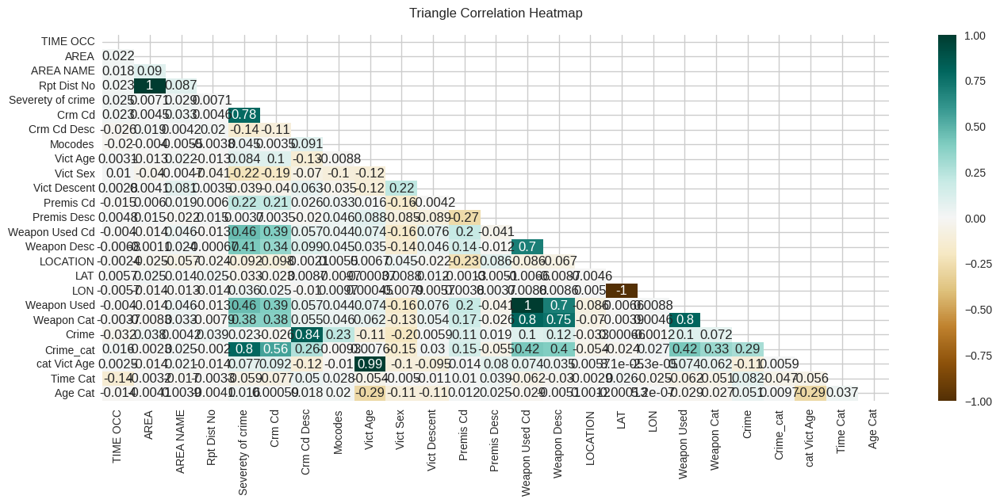

In [19]:
plt.figure(figsize=(16, 6))
# define the mask to set the values in the upper triangle to True
mask = np.triu(np.ones_like(df_analytics_trans.corr(), dtype=bool))
heatmap = sns.heatmap(df_analytics_trans.corr(), mask=mask, vmin=-1, vmax=1, annot=True, cmap='BrBG')
heatmap.set_title('Triangle Correlation Heatmap', fontdict={'fontsize':12}, pad=16)

gibt es viele Spalten, die hoch korreliert sind, so dass wir für die weitere Analyse den definierten Datenrahmen ohne hoch korrelierte Spalten von oben einschränken müssen.

In [20]:
df_clean = df_analytics_trans.copy()
df_clean.drop(['Rpt Dist No','cat Vict Age','Weapon Used Cd'], axis=1, inplace=True)

nach dem Löschen der korrelierten Spalten sieht unsere Matrix wie folgt aus, die -1 zwischen LAT und LON sollte vorhanden sein, da wir sonst keine Geoplots zeichnen können.

Text(0.5, 1.0, 'Triangle Correlation Heatmap')

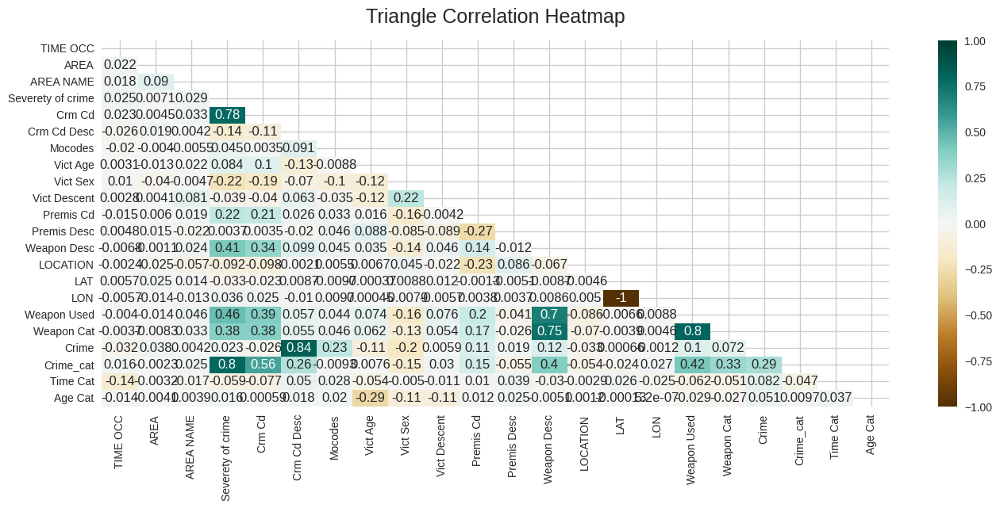

In [21]:
plt.figure(figsize=(16, 6))
# define the mask to set the values in the upper triangle to True
mask = np.triu(np.ones_like(df_clean.corr(), dtype=bool))
heatmap = sns.heatmap(df_clean.corr(), mask=mask, vmin=-1, vmax=1, annot=True, cmap='BrBG')
heatmap.set_title('Triangle Correlation Heatmap', fontdict={'fontsize':18}, pad=16)

### Descriptive analysis

##### Geodaten mapping

Hier benötigen wir ein numerisches df für unsere weitere Analyse, also machen wir eine Kopie von df_clean nach df_categorised

In [22]:
# Assuming you have latitude and longitude columns in your DataFrame
# Replace 'LAT' and 'LON' with the actual column names
df_clean['LAT'] = pd.to_numeric(df_clean['LAT'])
df_clean['LON'] = pd.to_numeric(df_clean['LON'])

# Create a GeoDataFrame from the DataFrame
gdf = gpd.GeoDataFrame(df_clean, geometry=gpd.points_from_xy(df_clean.LON, df_clean.LAT))

# Create a simple base map using Folium with a local tileset
m = folium.Map(location=[34.0522, -118.2437], zoom_start=10, tiles='openstreetmap')

# Use FastMarkerCluster for better performance
FastMarkerCluster(data=list(zip(gdf['LAT'], gdf['LON']))).add_to(m)

# Save the map as an HTML file
m.save('crime_hotspots_map.html')

# Display the map
m

stellen wir fest, dass es etwa 735 Datensätze außerhalb von LA gibt, die für Afrika geschlossen sind. Hier müssen wir diese Datensätze loswerden.

In [23]:
##Geodaten und extrapolation
fig = px.scatter_map(df_clean, lat="LAT", lon="LON", color='Weapon Cat')
fig.show()

Wir sehen, dass 735 Datensätze falsch sind, also beschränken wir LAT und LAtT nur auf LA. Wir machen den Rest 0 aus unserer Aufzeichnung.

In [24]:
df_cleaned_LA = df_clean[(df_clean['LON'] != 0)]
fig = px.scatter_map(df_cleaned_LA, lat="LAT", lon="LON", color='Weapon Cat')
fig.show()

### Verteilung von Weapon Kategorie

In [25]:
df_verteilung = df_clean['Weapon Cat'].value_counts().reset_index()
df_verteilung_normal = df_clean['Weapon Cat'].value_counts(normalize=True)

In [26]:
df_verteilung

,Weapon Cat,count
0,11,163852
1,13,39044
2,4,33435
3,15,21584
4,9,19080
5,10,14863
6,14,3124
7,8,2785
8,6,2275
9,1,434


In [27]:
fig = px.histogram(df_verteilung, x="Weapon Cat", y="count",# color="Weapon Cat",
                   marginal="box" #,  or violin, rug ,hover_data=df_verteilung.columns
                   )
# Set x-axis tick step to 1
fig.update_layout(
    xaxis=dict(
        dtick=1
    ),
    title="X-axis Step = 1"
)

fig.show()

##Clustering
Vorbereitung von K Means und silhouette Methode, um einen ersten Überblick über die Clustering-Analyse zu verschaffen, es hilft uns, die Anzahl der Cluster zu bestimmen.

----------------

In [28]:
# Option I
clusterAttributes = df_clean[['Vict Sex', 'Weapon Cat','Severety of crime']]
clusterAttributes.head()

,Vict Sex,Weapon Cat,Severety of crime
0,0,11,2
1,2,15,1
2,0,9,1
3,2,11,2
4,2,13,1


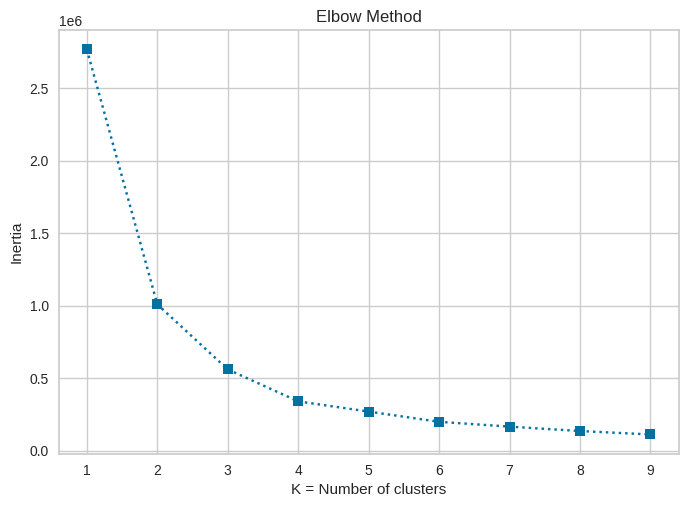

In [29]:
#Elbow Method
# dies ist die Variable, mit der wir die Trägheit (Inertia) jedes Modells speichern werden
inertia = []
clustersAmount = range(1,10)

# train 7 models with 1-8 Cluster
for i in clustersAmount:
    kmeans = cluster.KMeans(n_clusters=i, init='k-means++', max_iter=300, n_init=10, random_state=42)
    kmeans.fit(clusterAttributes)
    # append the inertia of each model to the inertia list
    inertia.append(kmeans.inertia_)

plt.plot(clustersAmount, inertia, "s:")
plt.title('Elbow Method')
plt.xlabel('K = Number of clusters')
plt.ylabel('Inertia')
plt.show()

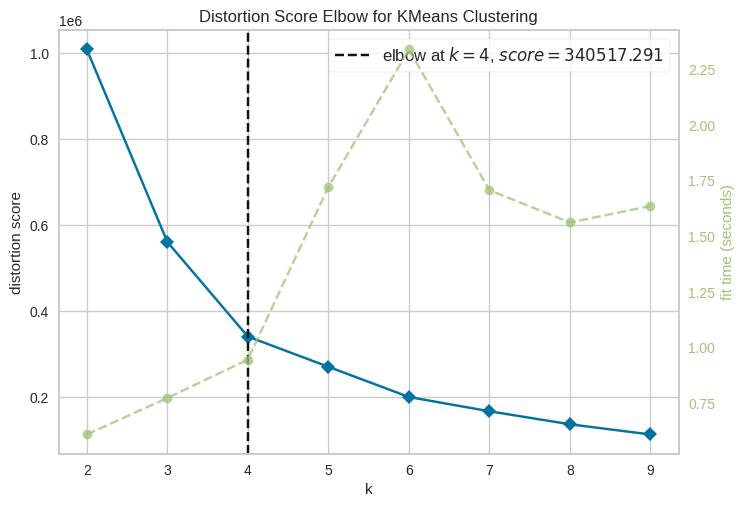

<Axes: title={'center': 'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [30]:
visualizer = KElbowVisualizer(kmeans, k=(2, 10))
visualizer.fit(clusterAttributes)
visualizer.show()

Hier haben wir aufgrund der höhen Datenzahl, nach einige Stunde war sogar keinen Ergebnis da, ist hier als fehlversuch dabei.

In [31]:
## unfortunatly doesnt make sense it took more than 15 min without giving any plot or results
# silhouette_scores = []
# range_n_clusters = range(2, 11)

# for n_clusters in range_n_clusters:
#     kmeans = KMeans(n_clusters=n_clusters, random_state=42)
#     cluster_labels = kmeans.fit_predict(clusterAttributes)
#     silhouette_avg = silhouette_score(clusterAttributes, cluster_labels)
#     silhouette_scores.append(silhouette_avg)

# # Plot the silhouette scores
# plt.figure(figsize=(8, 5))
# plt.plot(range_n_clusters, silhouette_scores, marker='o')
# plt.title('Silhouette Scores for Different Numbers of Clusters')
# plt.xlabel('Number of clusters')
# plt.ylabel('Average Silhouette Score')
# plt.grid(True)
# plt.show()

###Cluster the data
Anpassen der Cluster-Instanz an die ausgewählten Daten (fit).
Erstellen Sie eine neue Spalte, in der das identifizierte Cluster gespeichert wird.
Voraussagen, welchem Cluster die Kunden zugeordnet sind (predict).
Prüfen Sie, ob die Kunden einem Cluster zugewiesen wurden (predict). **cluster**

In [32]:
# erstellen der KMeans instanz
kmeans = KMeans(n_clusters = 4, init = 'k-means++', max_iter = 300, n_init = 10, random_state = 0)

In [33]:
# Anpassen (fitting) der instanz an den  selectierte data
kmeans.fit(clusterAttributes)
y_kmeans=kmeans.fit_predict(clusterAttributes)

In [34]:
# erstellen eine neue Spalte und prediktion der angegeben (assigned) cluster
df_clean['cluster'] = kmeans.predict(clusterAttributes)

In [35]:
df_clean.head(10)

,TIME OCC,AREA,AREA NAME,Severety of crime,Crm Cd,Crm Cd Desc,Mocodes,Vict Age,Vict Sex,Vict Descent,...,LOCATION,LAT,LON,Weapon Used,Weapon Cat,Crime,Crime_cat,Time Cat,Age Cat,cluster
0,2200,1,1,2,626,20,177495,30,0,16,...,29082,34.0618,-118.2424,400,11,40,8,1,5,1
1,2245,12,0,1,210,33,20107,21,2,6,...,38919,33.9610,-118.2695,511,15,30,7,1,5,3
2,2330,12,0,1,230,1,160790,28,0,1,...,332,33.9654,-118.2739,201,9,0,0,1,5,1
3,940,1,1,2,624,3,84903,42,2,0,...,13797,34.0639,-118.2295,400,11,3,8,0,0,2
4,310,2,13,1,310,8,172829,36,2,16,...,9448,34.0758,-118.2552,500,13,10,1,1,0,3
5,1255,9,17,2,624,3,62128,57,0,6,...,8326,34.1847,-118.4400,400,11,3,8,0,2,1
6,1000,8,18,2,624,3,113580,78,0,16,...,5496,34.0423,-118.4656,400,11,3,8,0,3,1
7,2035,12,0,1,230,1,174203,26,0,1,...,30251,33.9730,-118.2652,215,8,0,0,1,5,1
8,2350,7,20,2,624,3,62128,29,0,6,...,27065,34.0677,-118.3548,400,11,3,8,1,5,1
9,1900,5,4,1,440,47,5652,29,0,16,...,38319,33.7926,-118.3043,400,11,44,4,0,5,1


## Plot the clustering
- Stellen Sie die Cluster in einem Streudiagramm dar, um zu sehen, wie die Cluster verteilt sind.

In [36]:
X = clusterAttributes.values
kmeans = KMeans(n_clusters=4, init='k-means++', max_iter=300, n_init=10, random_state=0)
labels = kmeans.fit_predict(X)
centers = kmeans.cluster_centers_

#Inspect Cluster Centroids
centers_df = pd.DataFrame(kmeans.cluster_centers_, columns=['Vict Sex', 'Weapon Cat','Severety of crime'])
centers_df['Cluster'] = centers_df.index
centers_df = centers_df.sort_values(by='Severety of crime', ascending=True).reset_index(drop=True)
print(centers_df)

   Vict Sex  Weapon Cat  Severety of crime  Cluster
0  1.560387    4.089656           1.032014        0
1  1.270407   13.726126           1.466589        3
2  2.069496   10.552064           1.537347        2
3  0.000127   10.836427           1.683314        1


Hier sollten wir die richtigen Anzüge für den Cluster bekommen.

In [37]:
# Optional: Create human-readable labels based on approximate centroids
# You might adjust these based on actual center values
cluster_descriptions = {
    0: "Very High :  influence national crime statistics",
    3: "High      :  influence national crime statistics",
    2: "Mid       :  influence national crime statistics",
    1: "Low       :  influence national crime statistics"
}

In [38]:
df_cat['Vict Sex'].unique()

array(['F', 'M', 'X', 'H'], dtype=object)

In [39]:
df_clean['Vict Sex'].unique()

array([0, 2, 3, 1])

In [40]:
df_cat['Weapon Cat'].unique()

array(['Strong-Fist, Feet or Bodily Force', 'Verbal', 'Sting weapon',
       'Unknown', 'Slashing weapon', 'Firearm', 'Strike weapon',
       'Projectile', 'Stun Gun', 'Vehicle', 'Chemical weapon',
       'Fixed object', 'Fire', 'Explosive', 'Animal', 'Rope'],
      dtype=object)

In [41]:
df_clean['Weapon Cat'].unique()

array([11, 15,  9, 13,  8,  4, 10,  6, 12, 14,  1,  5,  3,  2,  0,  7])

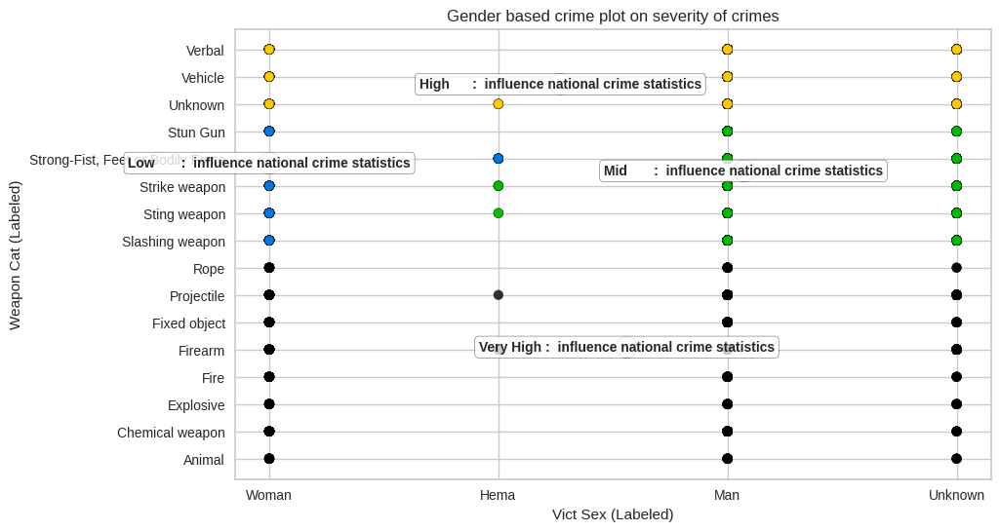

In [42]:
# Plot
plt.figure(figsize=(10, 6))
colors = cm.nipy_spectral(labels.astype(float) / kmeans.n_clusters)
plt.scatter(X[:, 0], X[:, 1], c=colors, s=50, edgecolor='k', alpha=0.8)

# Plot centroids and label them with interpretation
# Iterate through centers, extracting only the first two dimensions (Vict Sex and Weapon Desc)
for i, center in enumerate(centers):
    x, y = center[0], center[1] # Extract the first two values
    plt.scatter(x, y, s=250, c='white', edgecolor='black', marker='o')
    plt.text(x, y, f"{cluster_descriptions.get(i, f'Cluster {i}')}",
             fontsize=10, weight='bold', ha='center', va='center', bbox=dict(facecolor='white', alpha=0.8, boxstyle='round'))

plt.title('Gender based crime plot on severity of crimes')

# Convert to list of labels (as strings)
plt.xticks([0, 2, 3, 1], ['Woman', 'Man', 'Unknown', 'Hema'])
plt.yticks([11, 15,  9, 13,  8,  4, 10,  6, 12, 14,  1,  5,  3,  2,  0,  7],['Strong-Fist, Feet or Bodily Force', 'Verbal', 'Sting weapon',
       'Unknown', 'Slashing weapon', 'Firearm', 'Strike weapon',
       'Projectile', 'Stun Gun', 'Vehicle', 'Chemical weapon',
       'Fixed object', 'Fire', 'Explosive', 'Animal', 'Rope'])

# Update axis labels to reflect the data being plotted
plt.xlabel('Vict Sex (Labeled)')
plt.ylabel('Weapon Cat (Labeled)')
plt.grid(True)

### 3-D Clustering

<ipython-input-43-3690685502>:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



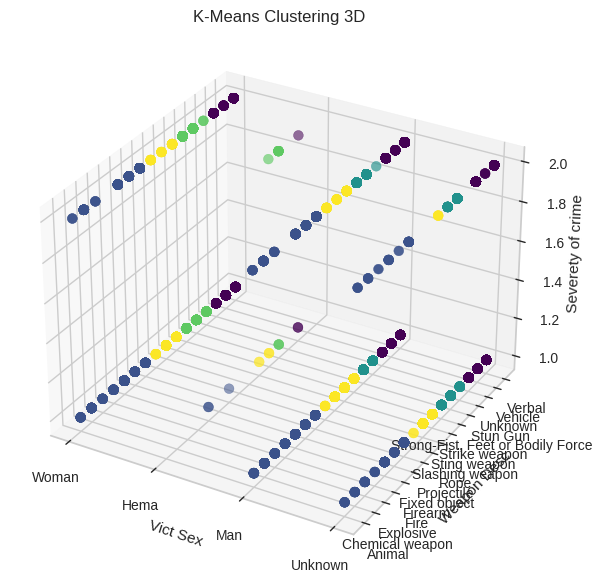

In [43]:
# Fit KMeans
kmeans = KMeans(n_clusters=5, random_state=42)
clusterAttributes['Cluster'] = kmeans.fit_predict(clusterAttributes)

# 3D Plot
fig = plt.figure(figsize=(10, 7))
ax = fig.add_subplot(111, projection='3d')
scatter = ax.scatter(
    clusterAttributes['Vict Sex'],
    clusterAttributes['Weapon Cat'],
    clusterAttributes['Severety of crime'],
    c=clusterAttributes['Cluster'],
    cmap='viridis',
    s=50
)

ax.set_title('K-Means Clustering 3D')
ax.set_xlabel('Vict Sex')
ax.set_ylabel('Weapon Desc')
ax.set_zlabel('Severety of crime')

# Convert to list of labels (as strings)
plt.xticks([0, 2, 3, 1], ['Woman', 'Man', 'Unknown', 'Hema'])
plt.yticks([11, 15,  9, 13,  8,  4, 10,  6, 12, 14,  1,  5,  3,  2,  0,  7],['Strong-Fist, Feet or Bodily Force', 'Verbal', 'Sting weapon',
       'Unknown', 'Slashing weapon', 'Firearm', 'Strike weapon',
       'Projectile', 'Stun Gun', 'Vehicle', 'Chemical weapon',
       'Fixed object', 'Fire', 'Explosive', 'Animal', 'Rope'])
plt.show()

<ipython-input-44-2901733029>:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



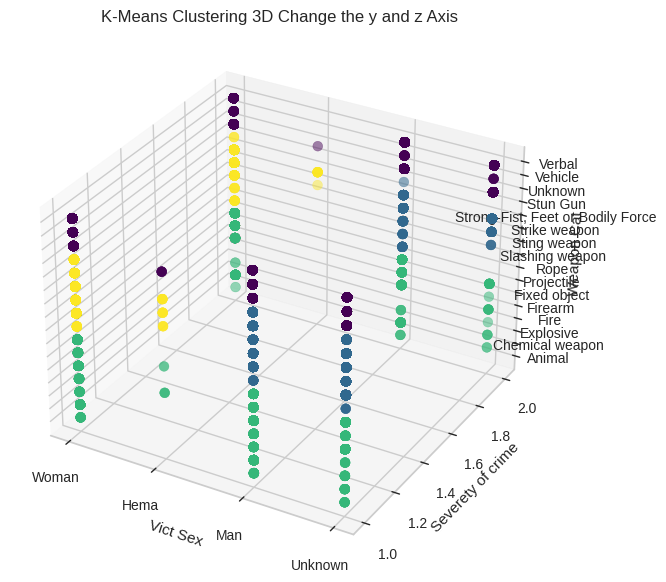

In [44]:
# Fit KMeans
kmeans = KMeans(n_clusters=4, random_state=42)
clusterAttributes['Cluster'] = kmeans.fit_predict(clusterAttributes)

# 3D Plot
fig = plt.figure(figsize=(10, 7))
ax = fig.add_subplot(111, projection='3d')
scatter = ax.scatter(
    clusterAttributes['Vict Sex'],
    clusterAttributes['Severety of crime'],
    clusterAttributes['Weapon Cat'],
    c=clusterAttributes['Cluster'],
    cmap='viridis',
    s=50
)

ax.set_title('K-Means Clustering 3D Change the y and z Axis')
ax.set_xlabel('Vict Sex')
ax.set_ylabel('Severety of crime')
ax.set_zlabel('Weapon Cat')

# Convert to list of labels (as strings)
plt.xticks([0, 2, 3, 1], ['Woman', 'Man', 'Unknown', 'Hema'])

# Use ax.set_zticks and ax.set_zticklabels for 3D plots
ax.set_zticks([11, 15,  9, 13,  8,  4, 10,  6, 12, 14,  1,  5,  3,  2,  0,  7])
ax.set_zticklabels(['Strong-Fist, Feet or Bodily Force', 'Verbal', 'Sting weapon',
       'Unknown', 'Slashing weapon', 'Firearm', 'Strike weapon',
       'Projectile', 'Stun Gun', 'Vehicle', 'Chemical weapon',
       'Fixed object', 'Fire', 'Explosive', 'Animal', 'Rope'])

plt.show()

# Story I
Wo ist eine Ethnische Frau am ehesten gefährdet, angegriffen zu werden?

In [45]:
df_story_1 = df_cat[(df_cat['Vict Descent']=='B') &(df_cat['Vict Sex']=='F')].groupby(['AREA NAME','Severety of crime'],as_index = False).size().reset_index().sort_values(by='size', ascending=False)
df_story_1.drop(['index'], axis=1, inplace=True)
df_story_1

,AREA NAME,Severety of crime,size
1,77th Street,2,3881
0,77th Street,1,3664
29,Southeast,2,3125
31,Southwest,2,2770
28,Southeast,1,2675
30,Southwest,1,1943
3,Central,2,1792
19,Newton,2,1286
2,Central,1,1197
18,Newton,1,958


Hier geht's zum Plotten unserer Geschichte mit Barplot, um visuelle Ergebnisse zu erhalten und die 7 gefährlichen Gebiete in Los Angeles zu kennen

Hier haben wir einmal als Bar Plot und einmal als Pie Diagramm der Thema dargestellt.

In [46]:
fig = px.histogram(df_story_1.head(12), x="AREA NAME", y="size",
             color='Severety of crime', barmode='group',
             height=400, title='Severety of crime per Area')
fig.show()

In [47]:
fig = px.pie(df_story_1.head(12), values='size', names='AREA NAME', title='Severety of crime per Area')
fig.show()

# Story II
Wo ist eine Frau am ehesten gefährdet, mit einer Schuss Waffe angegriffen zu werden?

In [48]:
df_story_2 = df_cat[(df_cat['Weapon Cat']=='Firearm') &(df_cat['Vict Sex']=='F')].groupby(['AREA NAME','Severety of crime'],as_index = False).size().reset_index().sort_values(by='size', ascending=False)
df_story_2.drop(['index'], axis=1, inplace=True)
df_story_2

,AREA NAME,Severety of crime,size
0,77th Street,1,1323
28,Southeast,1,984
18,Newton,1,710
30,Southwest,1,704
2,Central,1,406
8,Harbor,1,402
10,Hollenbeck,1,366
26,Rampart,1,336
14,Mission,1,325
22,Olympic,1,308


In [49]:
fig = px.histogram(df_story_2.head(20), x="AREA NAME", y="size",
             #color='Severety of crime', barmode='group',
              color='size', barmode='group',
             height=400, title='Severety of crime per Area against women and with firearm')
fig.show()

In [50]:
fig = px.pie(df_story_2.head(20), values='size', names='AREA NAME', title='Severety of crime per Area against women and with firearm')
fig.show()

### Story III
Wo sind die am häufigsten angegriffenen Altersgruppen und wie schwerwiegend war dieses Verbrechen?

In [51]:
df_story_3 = df_cat[df_cat['Weapon Cat']=='Firearm'].groupby(['AREA NAME','Severety of crime','Age Cat'],as_index = False).size().reset_index().sort_values(by='size', ascending=False)
df_story_3.drop(['index'], axis=1, inplace=True)
df_story_3

<ipython-input-51-1685163523>:1: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



,AREA NAME,Severety of crime,Age Cat,size
2,77th Street,1,Young Adult,1847
170,Southeast,1,Young Adult,1418
110,Newton,1,Young Adult,1224
182,Southwest,1,Young Adult,1168
3,77th Street,1,Adult,1091
...,...,...,...,...
239,West Valley,2,Senior,0
238,West Valley,2,Middle-aged,0
237,West Valley,2,Adult,0
246,Wilshire,2,Child,0


In [52]:
df_story_3.head(20)

,AREA NAME,Severety of crime,Age Cat,size
2,77th Street,1,Young Adult,1847
170,Southeast,1,Young Adult,1418
110,Newton,1,Young Adult,1224
182,Southwest,1,Young Adult,1168
3,77th Street,1,Adult,1091
14,Central,1,Young Adult,926
111,Newton,1,Adult,855
171,Southeast,1,Adult,800
158,Rampart,1,Young Adult,792
62,Hollenbeck,1,Young Adult,713


In [53]:
fig = px.histogram(df_story_3.head(20), x="AREA NAME", y="size",
             color='Age Cat', barmode='group',
             height=400, title='Severety of crime per Age category (20 head are with Severity 1)')
fig.show()

In [54]:
fig = px.pie(df_story_3.head(20), values='size', names='AREA NAME', title='Severety of crime per Age category (20 head are with 1 Severity)')
fig.show()

# Story IV
Schusswaffen werden mit größerer Wahrscheinlichkeit in bestimmten Bereichen der Kriminalität eingesetzt

In [55]:
df_story_4 = df_cat[df_cat['Weapon Cat']=='Firearm'].groupby(['AREA NAME','Crime_cat','Weapon Cat'],as_index = False).size().reset_index().sort_values(by='size', ascending=False)
df_story_4.drop(['index'], axis=1, inplace=True)
df_story_4.head(20)

,AREA NAME,Crime_cat,Weapon Cat,size
0,77th Street,Aggrevated Assaults,Firearm,2880
116,Southeast,Aggrevated Assaults,Firearm,2161
72,Newton,Aggrevated Assaults,Firearm,1955
125,Southwest,Aggrevated Assaults,Firearm,1710
7,77th Street,Robbery,Firearm,1232
9,Central,Aggrevated Assaults,Firearm,1136
33,Harbor,Aggrevated Assaults,Firearm,1135
107,Rampart,Aggrevated Assaults,Firearm,1122
40,Hollenbeck,Aggrevated Assaults,Firearm,1095
55,Mission,Aggrevated Assaults,Firearm,1031


In [56]:
fig = px.histogram(df_story_4.head(20), x="AREA NAME", y="size",
             color='Crime_cat', barmode='group',
             height=400, title='Crime Categories using Firearms per Area')
fig.show()

In [57]:
fig = px.pie(df_story_4.head(20), values='size', names='AREA NAME', title='Crime Categories using Firearms per Area')
fig.show()